In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import pylab as py
import scipy.stats as stats

In [2]:
df=pd.read_csv('Wind_turbine_data.csv')

In [3]:
initial_entry=df.shape[0]

In [4]:
df.head()

,Unnamed: 0,TurbID,Day,Tmstamp,Wspd,Wdir,Etmp,Itmp,Ndir,Pab1,Pab2,Pab3,Prtv,Patv
0,0,1,1,00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10,1,1,01:40,6.87,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
2,20,1,1,03:20,6.57,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
3,30,1,1,05:00,9.40,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60
4,40,1,1,06:40,12.81,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55


# Pictorial Representation of our data on a turbine
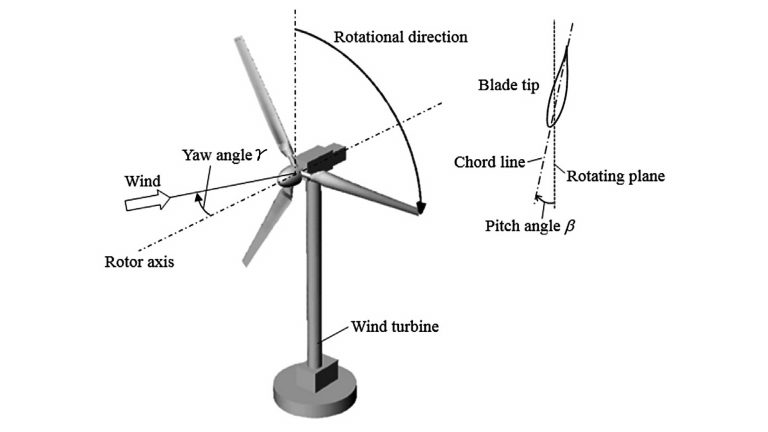

In [5]:
del df['Unnamed: 0']

In [6]:
df.dropna(inplace=True) #Dropping all the NaN Values
Column_list=['Turbine_ID','Day','Time_Stamp','Wind_speed','Wind_direction','Temp_of_environment','Temperature_of_turbine','Nacelle direction',' Pitch angle of blade 1', 'Pitch angle of blade 2', 'Pitch angle of blade 3','Reactive power','Active power']
df.columns=Column_list # changing the column name for better understanding
final_entry=df.shape[0]
df.shape

(467562, 13)

In [7]:
data_lost_perc=(initial_entry-final_entry)/(initial_entry)*100
data_lost_perc
# Around 1% of data is lost in removing the Entries with NaN values which is acceptable

1.0978271905777235

In [8]:
df.head()

,Turbine_ID,Day,Time_Stamp,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
1,1,1,01:40,6.87,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
2,1,1,03:20,6.57,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
3,1,1,05:00,9.40,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60
4,1,1,06:40,12.81,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55
5,1,1,08:20,11.21,-1.38,29.17,42.24,-28.84,1.04,1.04,1.04,-0.25,1534.77


In [9]:
#Description of the data an its attributes
desc=df.describe()
desc

,Turbine_ID,Day,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
count,467562.000000,467562.000000,467562.000000,467562.000000,467562.000000,467562.000000,467562.000000,467562.000000,467562.000000,467562.000000,467562.000000,467562.000000
mean,67.482644,123.490900,5.032796,0.688080,41.115066,27.410588,188.570267,26.820706,26.804507,26.793653,-12.959092,350.123394
std,38.670021,70.760141,3.403607,31.598318,85.248200,18.229159,163.366111,38.807916,38.801052,38.794621,70.421340,424.718890
min,1.000000,1.000000,0.000000,-307.370000,-272.960000,-273.170000,-884.860000,-10.000000,-10.000000,-10.000000,-530.070000,-7.810000
25%,34.000000,62.000000,2.240000,-3.790000,14.040000,20.050000,62.800000,0.010000,0.010000,0.010000,-38.140000,-0.300000
50%,67.000000,124.000000,4.340000,-0.200000,25.740000,30.080000,194.760000,0.550000,0.550000,0.550000,-0.300000,178.960000
75%,101.000000,185.000000,7.020000,3.460000,32.737500,36.830000,322.080000,83.990000,83.980000,83.980000,0.000000,547.667500
max,134.000000,245.000000,24.720000,1454.680000,394.330000,261.240000,700.570000,99.980000,99.980000,94.630000,373.950000,1560.750000


In [10]:
#Dropping the unneccesary columns for better evaluatiion
df1=df.copy()

In [11]:
df1.head()

,Turbine_ID,Day,Time_Stamp,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
1,1,1,01:40,6.87,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
2,1,1,03:20,6.57,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
3,1,1,05:00,9.40,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60
4,1,1,06:40,12.81,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55
5,1,1,08:20,11.21,-1.38,29.17,42.24,-28.84,1.04,1.04,1.04,-0.25,1534.77


In [12]:
del df1['Turbine_ID']
del df1['Time_Stamp']
del df1['Day']
df1.head()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
1,6.87,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
2,6.57,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
3,9.40,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60
4,12.81,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55
5,11.21,-1.38,29.17,42.24,-28.84,1.04,1.04,1.04,-0.25,1534.77


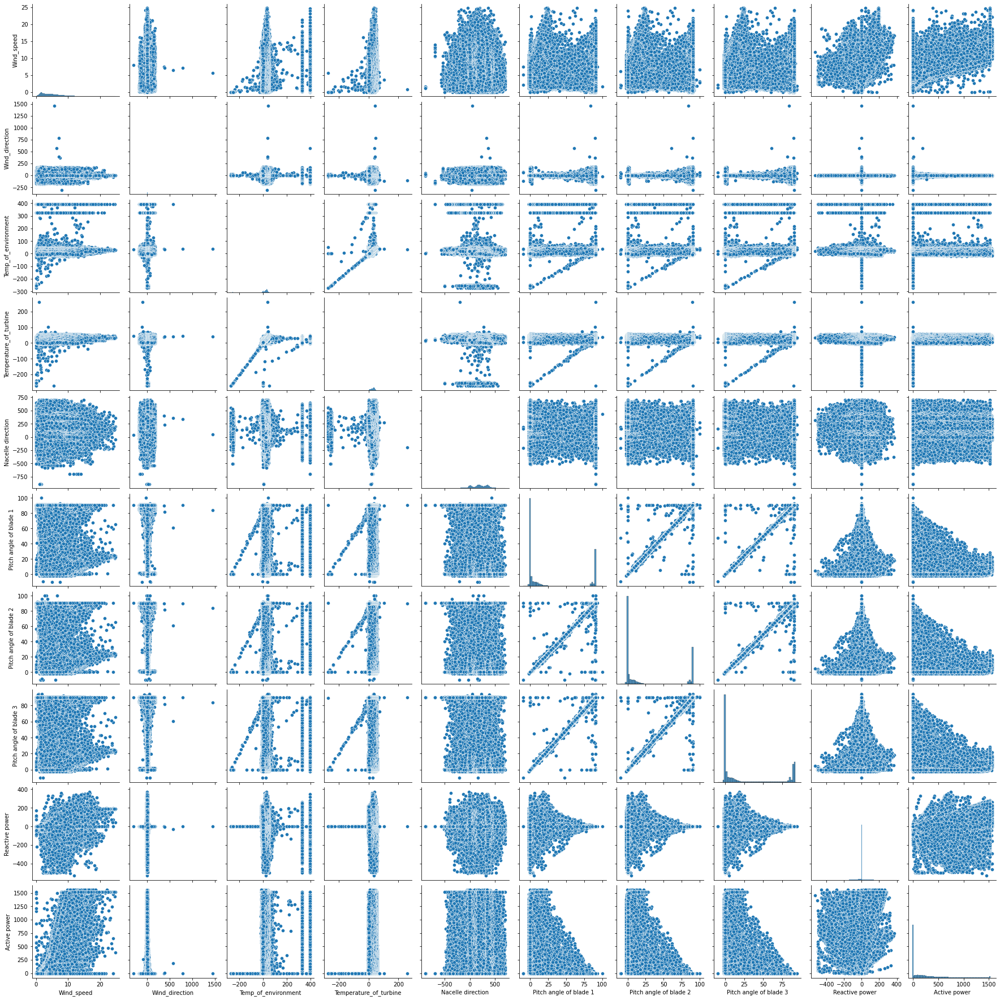

In [13]:
# Here we have a rough pairplot of our data 
#Since all of our attributes are independent of each other except our target which is active power
#Hence Not much can be deduced using pairplot
sns.pairplot(df1)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


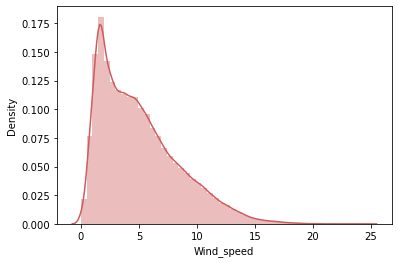

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


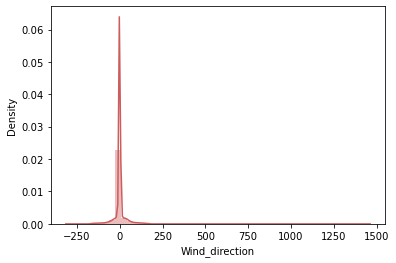

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


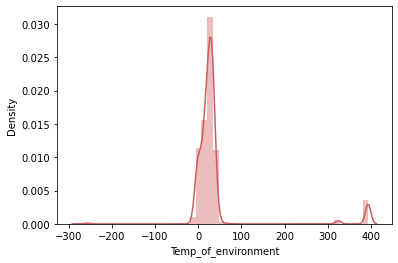

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


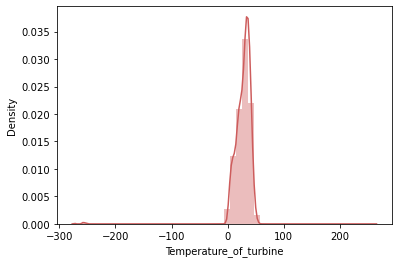

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


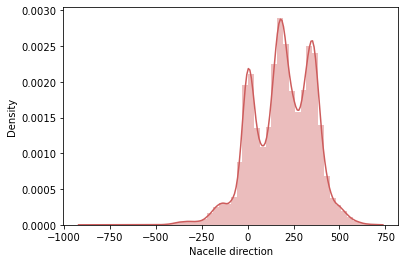

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


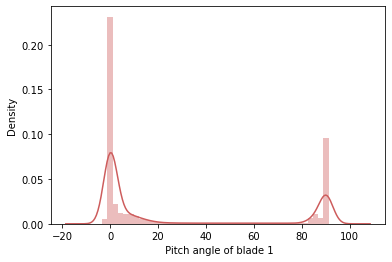

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


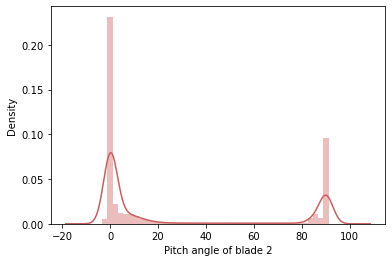

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


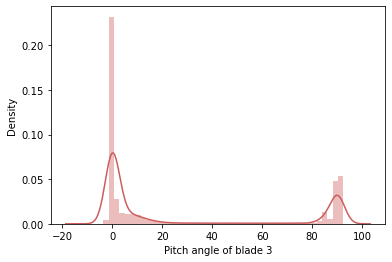

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


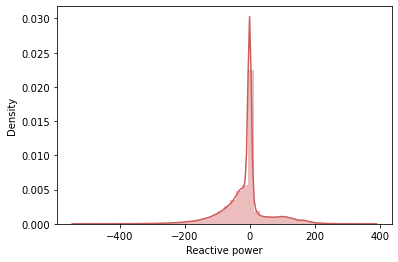

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


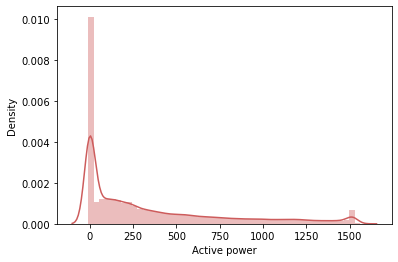

In [14]:
# Lets check the distribution of data
l=list(df1.columns)
for i in l:
    
    sns.distplot(df1[i],color='indianred')
    plt.show()

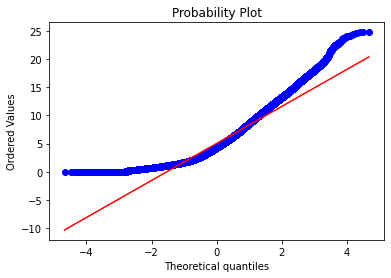

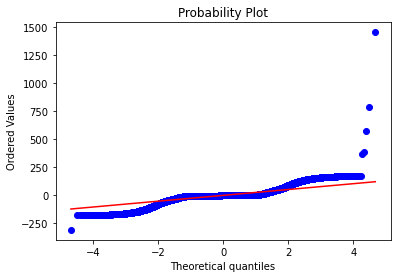

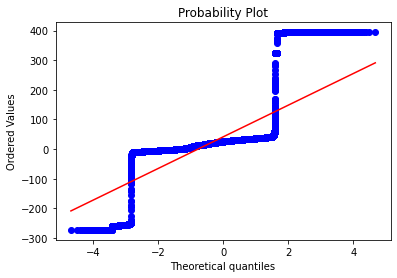

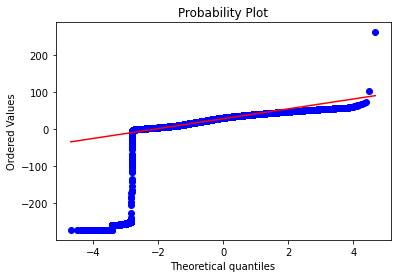

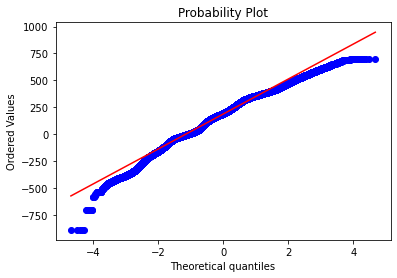

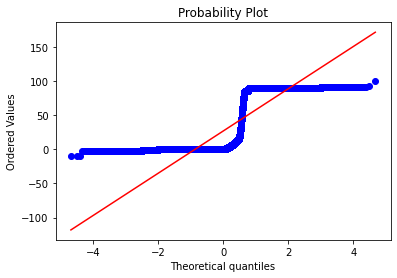

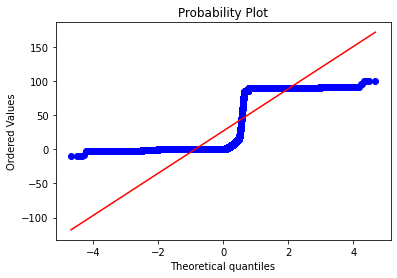

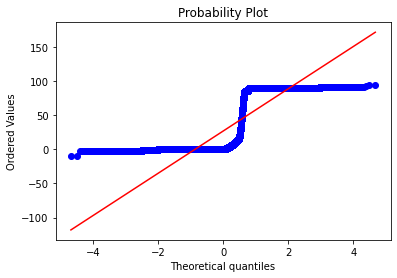

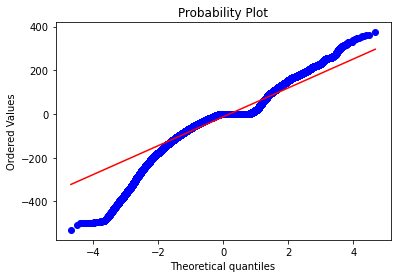

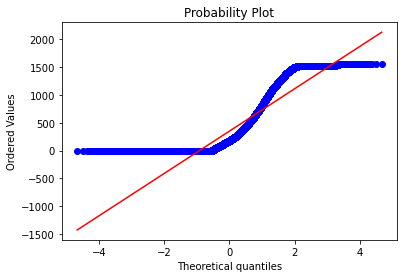

In [15]:
for i in l:
    stats.probplot(df1[i], dist="norm", plot=py)
    py.show()

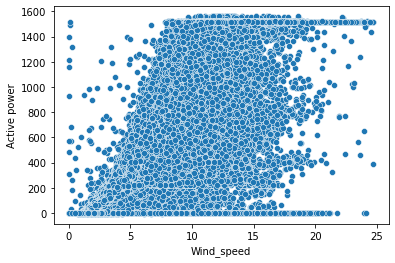

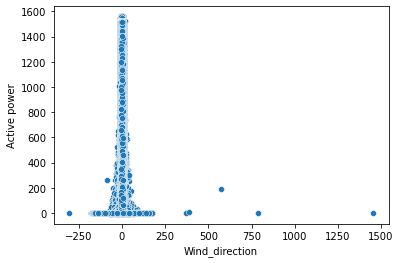

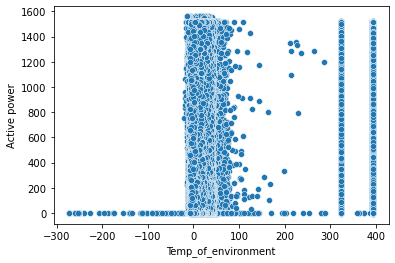

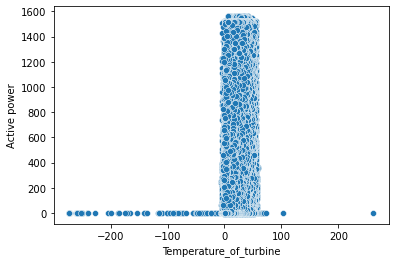

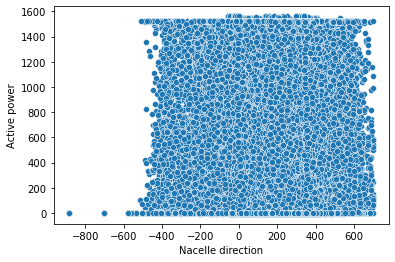

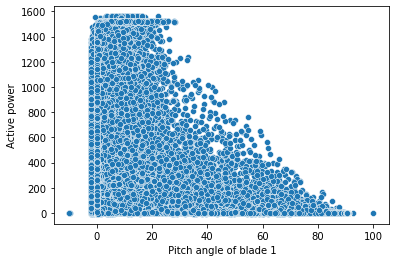

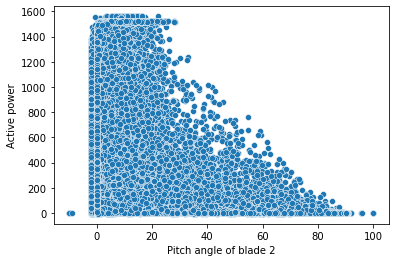

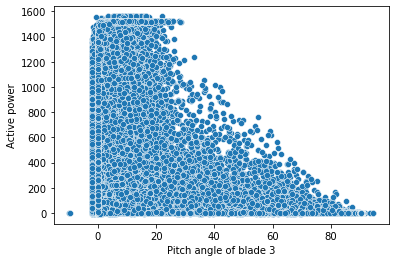

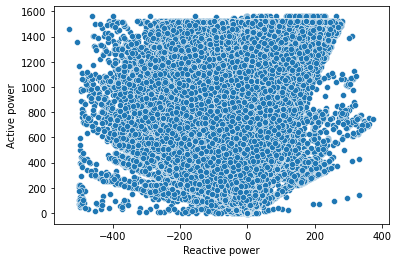

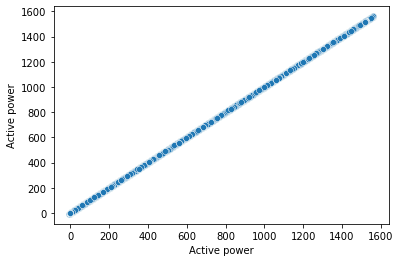

In [16]:
 #Lets plot scatter plots for correltion analysis with our target
for z in l:
    sns.scatterplot(data=df1,x=df1[z],y=df1['Active power'])
    plt.show()
    

In [17]:
# From  the above plot we can make out a few correlation though it is still very vague we could see a few patterns generate 

In [18]:
#from scada_data_analysis.modules.power_curve_preprocessing import PowerCurveFiltering
# Cant import powercurvefiltering s

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<AxesSubplot:xlabel='Wind_speed', ylabel='Density'>

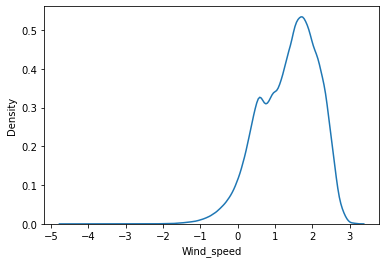

In [19]:
df1['Wind_speed']=np.log(df1['Wind_speed'])
sns.kdeplot(df1['Wind_speed'])

<AxesSubplot:xlabel='Wind_speed', ylabel='Density'>

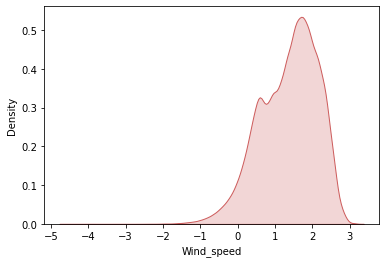

In [20]:
sns.kdeplot(df1['Wind_speed'],color='indianred',shade=True)

In [21]:
# As we can see there are few anomalies in the dataset where temperature going below -50 which is not possible in general we will try to drop those datasets
df1['Index']=range(df1.shape[0])
df1['index']=range(df1.shape[0])
df1=df1.set_index('Index')
df1.head()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power,index
Index,,,,,,,,,,,
0,1.927164,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47,0
1,1.882514,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05,1
2,2.240710,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60,2
3,2.550226,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55,3
4,2.416806,-1.38,29.17,42.24,-28.84,1.04,1.04,1.04,-0.25,1534.77,4


In [22]:
list1=[]
def preprocessing(i):
    if df1.loc[i,'Temp_of_environment'] <-50 or df1.loc[i,'Temperature_of_turbine']<-50 or df1.loc[i,'Temp_of_environment'] >60 or df1.loc[i,'Temperature_of_turbine'] >100: 
        list1.append(i)
        return 1
    else: return 0
    
list2=df1['index'].apply(preprocessing)
    

In [23]:
len(list1)

27707

In [24]:
df1=df1.drop(list1)
del df1['index']

In [25]:
df1.tail()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
Index,,,,,,,,,,
467557,2.030776,-3.75,2.23,5.91,164.28,0.02,0.02,0.02,66.36,972.63
467558,1.981001,-1.22,2.09,5.40,164.45,0.03,0.03,0.04,-46.10,879.48
467559,1.678964,0.09,0.39,3.45,170.40,0.03,0.04,0.04,-50.78,405.10
467560,1.619388,-4.43,-0.12,3.22,179.46,0.03,0.03,0.04,-90.58,351.98
467561,1.887070,2.87,-0.30,3.38,203.44,0.02,0.02,0.02,-10.09,593.52


In [26]:
df1['Index']=range(df1.shape[0])
df1=df1.set_index('Index')
df1.head()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
Index,,,,,,,,,,
0,1.927164,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
1,1.882514,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
2,2.240710,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60
3,2.550226,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55
4,2.416806,-1.38,29.17,42.24,-28.84,1.04,1.04,1.04,-0.25,1534.77


In [27]:
desc1=df1.describe()
desc1

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
count,4.398550e+05,439855.000000,439855.000000,439855.000000,439855.000000,439855.000000,439855.000000,439855.000000,439855.000000,439855.000000
mean,-inf,0.704523,21.662732,28.319478,189.419730,26.919008,26.903831,26.889814,-12.989793,350.672454
std,NaN,31.599151,12.989760,11.436920,163.383113,38.852588,38.846315,38.838038,70.328349,424.628648
min,-inf,-307.370000,-49.990000,-49.000000,-884.860000,-10.000000,-10.000000,-10.000000,-530.070000,-7.810000
25%,8.109302e-01,-3.780000,13.370000,20.310000,66.090000,0.010000,0.010000,0.010000,-38.230000,-0.300000
50%,1.470176e+00,-0.210000,24.810000,30.300000,195.340000,0.590000,0.590000,0.590000,-0.300000,180.040000
75%,1.948763e+00,3.480000,31.550000,37.040000,322.280000,84.170000,84.060000,83.990000,0.000000,548.680000
max,3.207613e+00,1454.680000,59.990000,72.350000,700.570000,99.980000,99.980000,94.630000,373.950000,1560.750000


In [28]:
#list_drop=[]
#list_col=list(df1.columns)
#def preprocessing2(i,list_col1):
#    list_col=list(df1.columns)
#    max1=desc1.loc['mean',list_col1]+(2*desc1.loc['std',list_col1])
#    min1=desc1.loc['mean',list_col1]-(2*desc1.loc['std',list_col1])
#    if df1.loc[i,list_col1] > max1 or df1.loc[i,list_col1] < min1:
#        list_drop.append(i)
#       return 1
#    else:
#        return 0
#list_trash=preprocessing2(df1['index'],list_col)

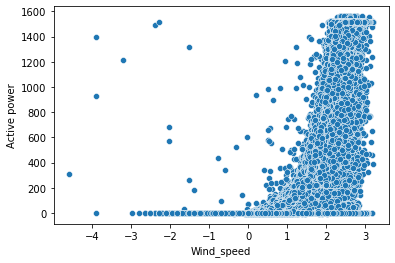

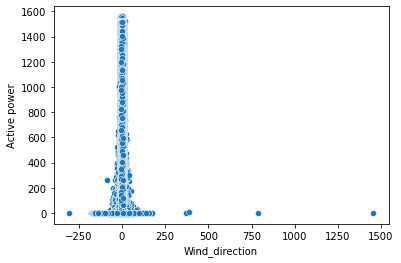

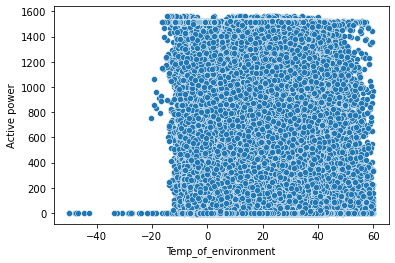

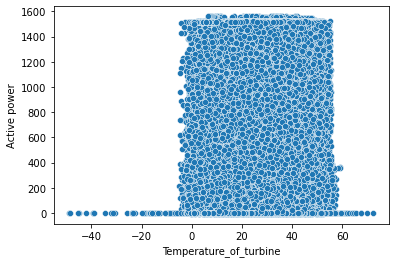

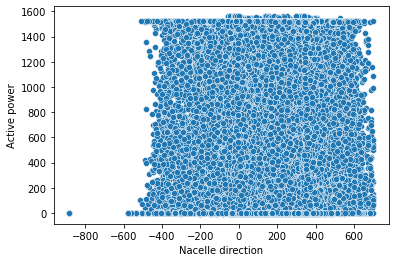

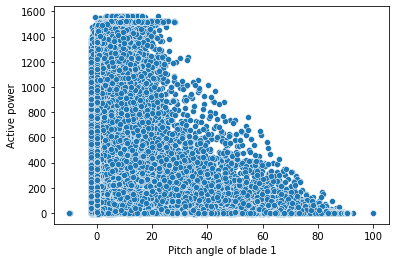

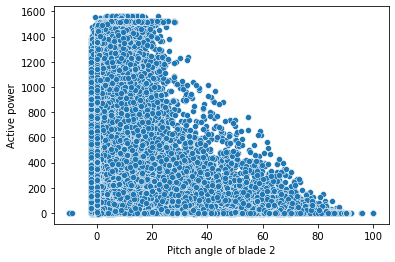

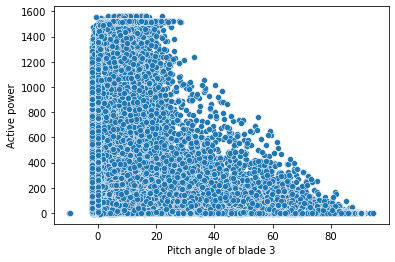

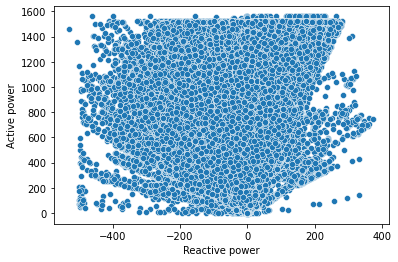

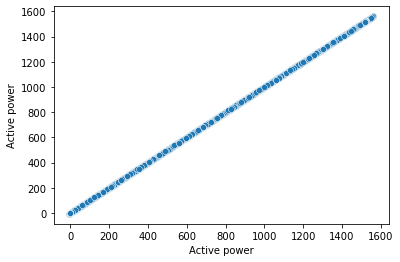

In [29]:
# Lets plot scatter plots for correltion analysis with our target
for z in l:
    sns.scatterplot(data=df1,x=df1[z],y=df1['Active power'])
    plt.show()

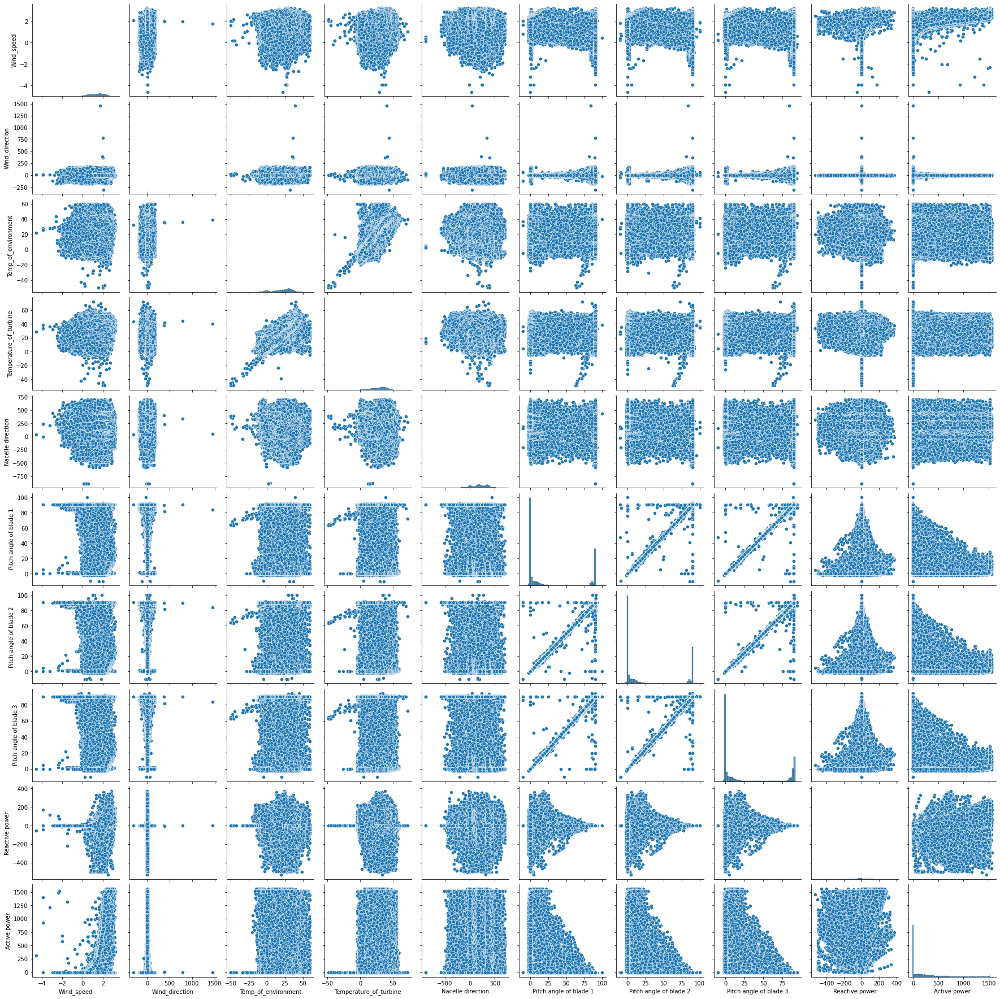

In [30]:
sns.pairplot(df1)

# Hence from the above plots after dropping a few outliers we couuld see a clearer picture 
# Wind speed is surely an increasing factor as its forming an incline pattern more refiniing is needed for a crisp plot
# Wind directions also affecting the active power  mostly we see the power genearetd only when the angle is zero
# Temperature of environment and temp of  turbine is not affecting the power in any was as deduced from the plot
# Pitch angle of the blades are making a declining slope aagainst the power hence lower the pitch angle more the power
# Reactive power is forming an ambiguous pattern of a dispersion plot more refinemnet is needed for deduction

In [31]:
# Now lets use clustering

In [32]:
from sklearn.cluster import KMeans

In [33]:
df.head()

,Turbine_ID,Day,Time_Stamp,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
1,1,1,01:40,6.87,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
2,1,1,03:20,6.57,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
3,1,1,05:00,9.40,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60
4,1,1,06:40,12.81,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55
5,1,1,08:20,11.21,-1.38,29.17,42.24,-28.84,1.04,1.04,1.04,-0.25,1534.77


In [34]:
X=df.loc[:,['Turbine_ID','Wind_speed','Wind_direction','Nacelle direction','Active power']]


In [35]:
from sklearn.cluster import KMeans


In [36]:
K= range(1,10)
SSD=[]
for k in K:
    km=KMeans(n_clusters=k)
    km=km.fit(X)
    SSD.append(km.inertia_)


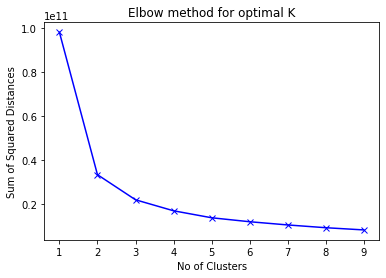

In [37]:
plt.plot(K,SSD,'bx-')
plt.xlabel('No of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow method for optimal K')
plt.show()

# So from the graph we can deduce that the best no of clusters that can be formed is 4

# From the plots we can see that wind speed , wind direction and pitch angles are directly influencing the power generated
# Nacelle direction also affects the power but generating a patternn is hard from it so we will not include it in our model


In [38]:
df.tail()

,Turbine_ID,Day,Time_Stamp,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
472747,134,245,15:40,7.62,-3.75,2.23,5.91,164.28,0.02,0.02,0.02,66.36,972.63
472748,134,245,17:20,7.25,-1.22,2.09,5.40,164.45,0.03,0.03,0.04,-46.10,879.48
472749,134,245,19:00,5.36,0.09,0.39,3.45,170.40,0.03,0.04,0.04,-50.78,405.10
472750,134,245,20:40,5.05,-4.43,-0.12,3.22,179.46,0.03,0.03,0.04,-90.58,351.98
472751,134,245,22:20,6.60,2.87,-0.30,3.38,203.44,0.02,0.02,0.02,-10.09,593.52


In [39]:
df1.tail()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
Index,,,,,,,,,,
439850,2.030776,-3.75,2.23,5.91,164.28,0.02,0.02,0.02,66.36,972.63
439851,1.981001,-1.22,2.09,5.40,164.45,0.03,0.03,0.04,-46.10,879.48
439852,1.678964,0.09,0.39,3.45,170.40,0.03,0.04,0.04,-50.78,405.10
439853,1.619388,-4.43,-0.12,3.22,179.46,0.03,0.03,0.04,-90.58,351.98
439854,1.887070,2.87,-0.30,3.38,203.44,0.02,0.02,0.02,-10.09,593.52


In [40]:

df1.head()
df1['index1']=range(df1.shape[0])
df1.head()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power,index1
Index,,,,,,,,,,,
0,1.927164,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47,0
1,1.882514,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05,1
2,2.240710,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60,2
3,2.550226,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55,3
4,2.416806,-1.38,29.17,42.24,-28.84,1.04,1.04,1.04,-0.25,1534.77,4


In [41]:
wsp1=np.percentile(df1['Wind_speed'],90)
wsp2=np.percentile(df1['Wind_speed'],10)
pap11=np.percentile(df1[' Pitch angle of blade 1'],90)
pap12=np.percentile(df1[' Pitch angle of blade 1'],10)
pap21=np.percentile(df1['Pitch angle of blade 2'],90)
pap22=np.percentile(df1['Pitch angle of blade 2'],10)
pap31=np.percentile(df1['Pitch angle of blade 3'],90)
pap32=np.percentile(df1['Pitch angle of blade 3'],10)
act1=np.percentile(df1['Active power'],90)
act2=np.percentile(df1['Active power'],10)

In [42]:
list7=[]
def pre(i):
    if df1.loc[i,'Wind_speed'] > wsp1 or df1.loc[i,'Wind_speed']  < wsp2  or df1.loc[i,' Pitch angle of blade 1'] < pap12: #df1.loc[i,' Pitch angle of blade 1'] > pap11:  or df1.loc[i,' Pitch angle of blade 1'] < pap12 :#or df1.loc[i,'Pitch angle of blade 2'] > pap21 or df1.loc[i,'Pitch angle of blade 2'] < pap22 or df1.loc[i,'Pitch angle of blade 3'] >pap31 or df1.loc[i,'Pitch angle of blade 3'] < pap 32 :
        list7.append(i)
        return 1
    else: return 0
trsh=df1['index1'].apply(pre)
        

In [43]:
#or df1.loc[i,' Pitch angle of blade 1'] < pap12 or df1.loc[i,'Pitch angle of blade 2'] > pap21 or df1.loc[i,'Pitch angle of blade 2'] < pap22 or df1.loc[i,'Pitch angle of blade 3'] >pap31 or df1.loc[i,'Pitch angle of blade 3'] < pap 32
len(list7)

97832

In [44]:
def pre1(i):
    if  df1.loc[i,' Pitch angle of blade 1'] > pap11 or df1.loc[i,'Pitch angle of blade 2'] > pap21 or df1.loc[i,'Pitch angle of blade 2'] < pap22 : #or df1.loc[i,'Pitch angle of blade 3'] >pap31 or df1.loc[i,'Pitch angle of blade 3'] < pap 32 :
        list7.append(i)
        return 1
    else: return 0
trsh=df1['index1'].apply(pre1)

In [45]:
def pre2(i):
    if df1.loc[i,'Pitch angle of blade 3'] >pap31 or df1.loc[i,'Pitch angle of blade 3'] < pap32 :
        list7.append(i)
        return 1
    else: return 0
trsh=df1['index1'].apply(pre2)

In [46]:
def pre3(i):
    if df1.loc[i,'Active power'] >act1 or df1.loc[i,'Active power'] < act2 :
        list7.append(i)
        return 1
    else: return 0
trsh=df1['index1'].apply(pre3)

In [47]:
len(list7)

258463

In [48]:
arr=np.array(list7)
arr=np.unique(arr)
arr.shape

(153180,)

In [49]:
list8=list(arr)


In [50]:
len(list8)

153180

In [51]:

del df1['index1']

In [52]:
df1.head()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
Index,,,,,,,,,,
0,1.927164,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
1,1.882514,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
2,2.240710,-3.15,30.19,41.29,-1.83,1.00,1.00,1.00,-0.22,1179.60
3,2.550226,-2.17,29.44,41.51,-23.73,1.07,1.07,1.07,-0.26,1539.55
4,2.416806,-1.38,29.17,42.24,-28.84,1.04,1.04,1.04,-0.25,1534.77


In [53]:
df1=df1.drop(list8)

In [54]:
df1['index']=range(df1.shape[0])
df1=df1.set_index('index')
df1.head()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
index,,,,,,,,,,
0,1.927164,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
1,1.882514,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
2,1.932970,5.91,34.38,46.42,32.56,1.11,1.11,1.11,-0.02,628.13
3,1.843719,-2.81,35.87,46.49,47.97,1.12,1.12,1.12,0.01,457.33
4,1.763017,-42.78,39.33,50.18,81.45,1.90,1.90,1.90,-0.30,-0.30


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


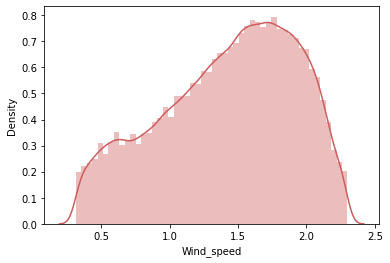

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


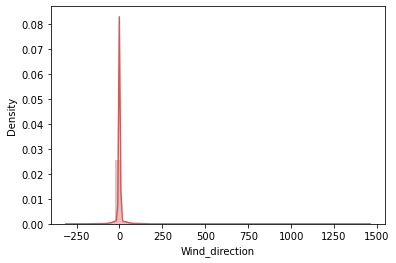

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


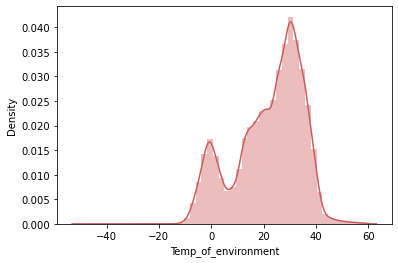

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


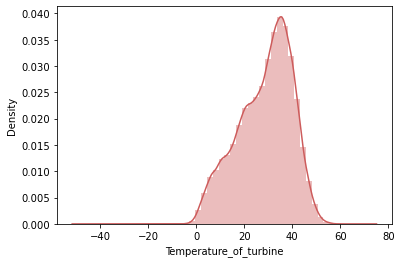

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


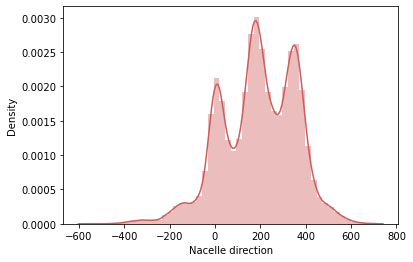

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


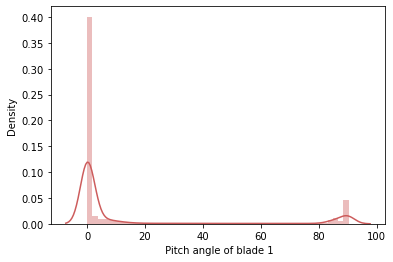

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


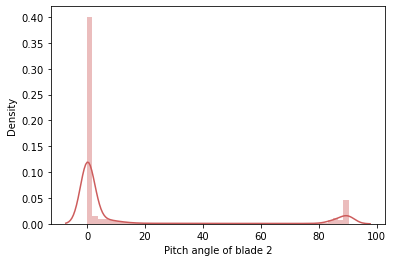

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


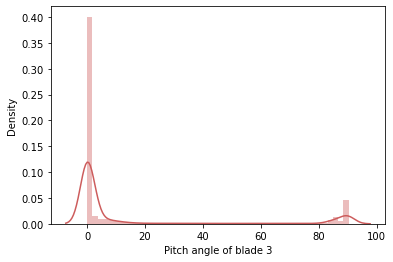

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


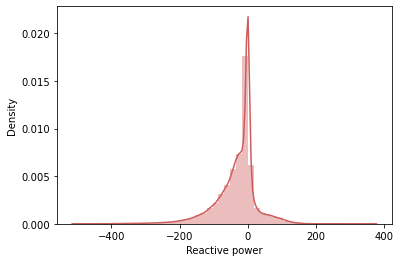

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


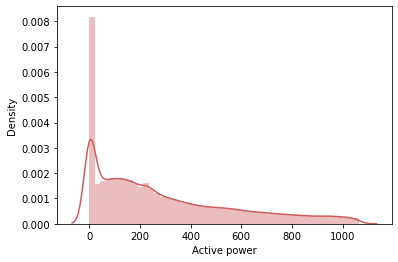

In [55]:
l=list(df1.columns)
for i in l:
    
    sns.distplot(df1[i],color='indianred')
    plt.show()

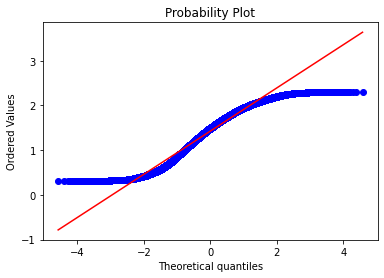

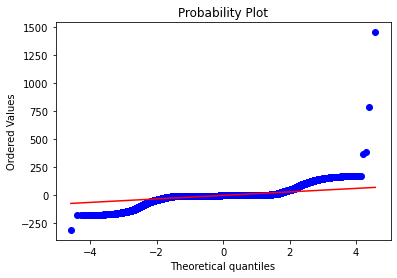

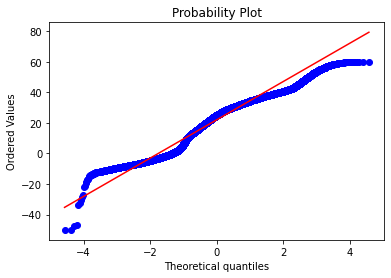

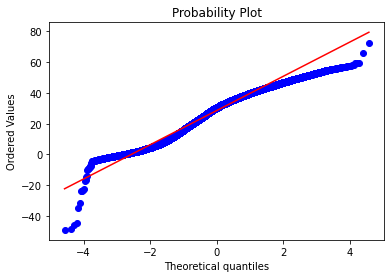

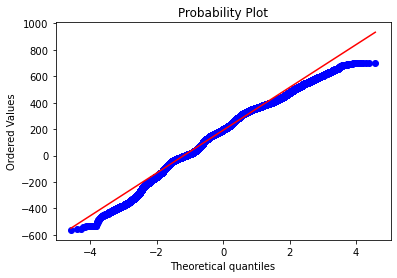

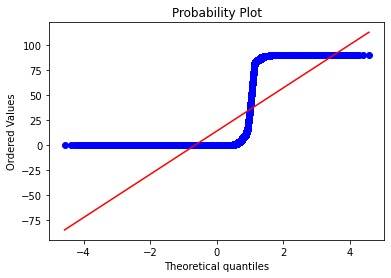

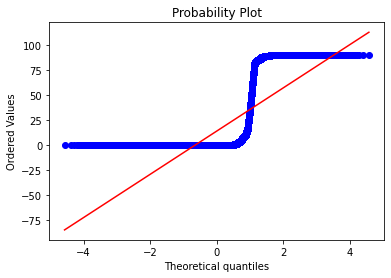

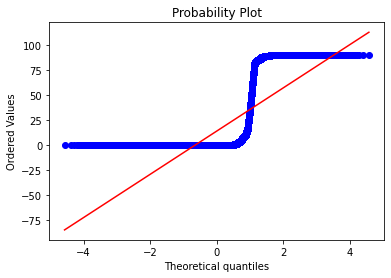

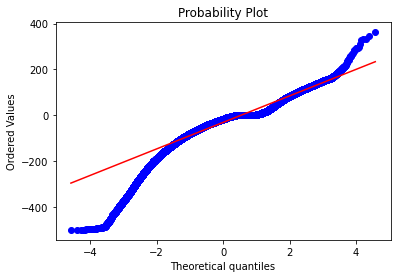

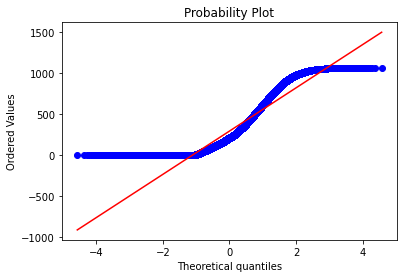

In [56]:
for i in l:
    stats.probplot(df1[i], dist="norm", plot=py)
    py.show()

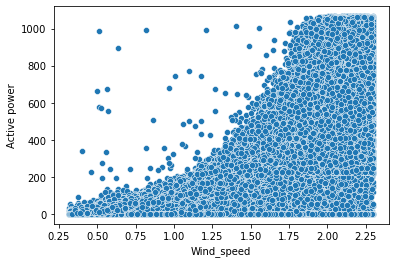

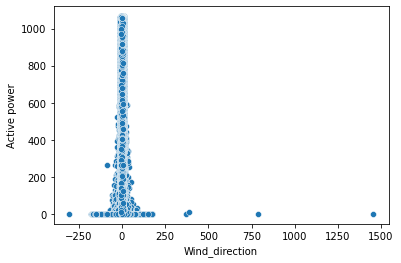

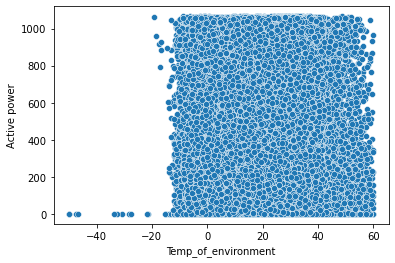

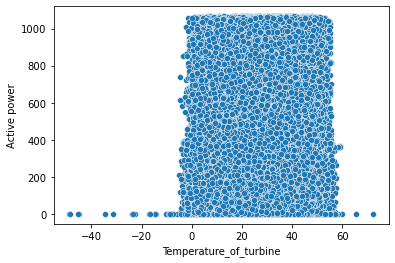

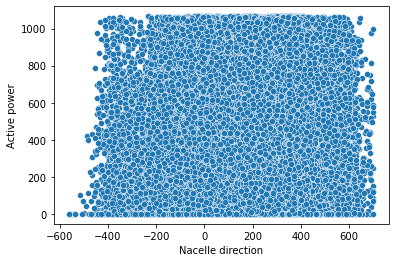

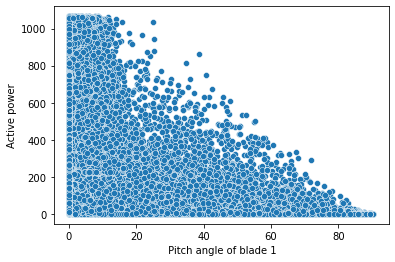

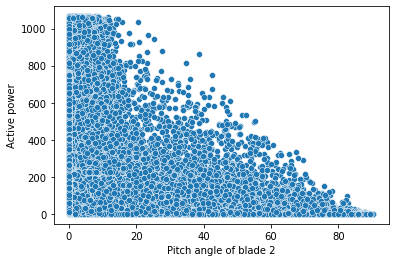

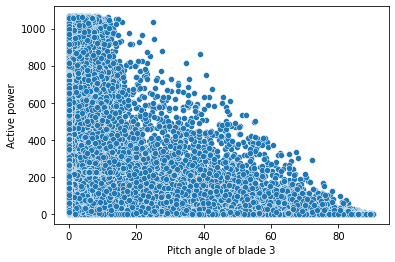

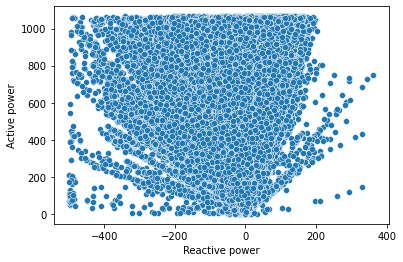

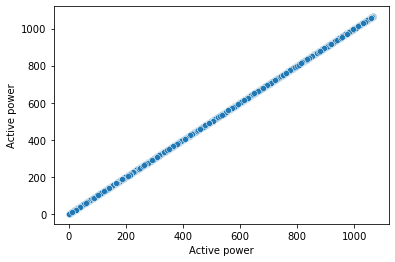

In [57]:
for z in l:
    sns.scatterplot(data=df1,x=df1[z],y=df1['Active power'])
    plt.show()

In [58]:
corr=df1.corr()
corr.style.background_gradient(cmap='coolwarm')

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
Wind_speed,1.000000,-0.059823,0.098560,0.126316,-0.032291,-0.463397,-0.463331,-0.463337,-0.231122,0.819065
Wind_direction,-0.059823,1.000000,-0.011088,-0.015573,0.008798,0.061219,0.061383,0.061415,0.017753,-0.035895
Temp_of_environment,0.098560,-0.011088,1.000000,0.884594,-0.069035,0.024881,0.024941,0.024937,0.041377,0.014957
Temperature_of_turbine,0.126316,-0.015573,0.884594,1.000000,-0.067518,-0.030751,-0.030645,-0.030672,0.031785,0.068081
Nacelle direction,-0.032291,0.008798,-0.069035,-0.067518,1.000000,-0.006320,-0.006394,-0.006433,-0.031162,-0.013247
Pitch angle of blade 1,-0.463397,0.061219,0.024881,-0.030751,-0.006320,1.000000,0.999782,0.999800,0.221585,-0.452693
Pitch angle of blade 2,-0.463331,0.061383,0.024941,-0.030645,-0.006394,0.999782,1.000000,0.999825,0.221595,-0.452690
Pitch angle of blade 3,-0.463337,0.061415,0.024937,-0.030672,-0.006433,0.999800,0.999825,1.000000,0.221602,-0.452699
Reactive power,-0.231122,0.017753,0.041377,0.031785,-0.031162,0.221585,0.221595,0.221602,1.000000,-0.184577
Active power,0.819065,-0.035895,0.014957,0.068081,-0.013247,-0.452693,-0.452690,-0.452699,-0.184577,1.000000


<AxesSubplot:>

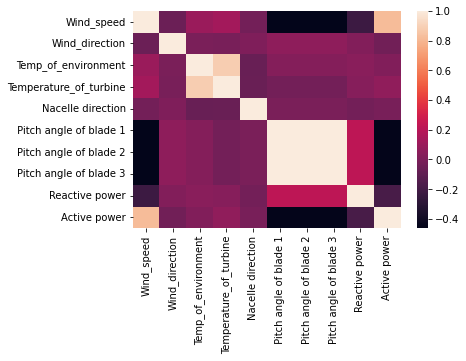

In [59]:
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

<AxesSubplot:xlabel='Wind_speed', ylabel='Density'>

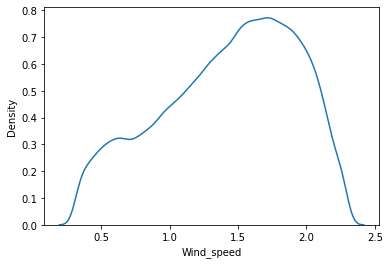

In [60]:
sns.kdeplot(df1['Wind_speed'])

In [61]:
X1=df1.loc[:,['Wind_speed','Wind_direction',' Pitch angle of blade 1','Pitch angle of blade 2','Pitch angle of blade 3']]
X1.head()

,Wind_speed,Wind_direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3
index,,,,,
0,1.927164,-4.58,1.00,1.00,1.00
1,1.882514,-3.02,1.00,1.00,1.00
2,1.932970,5.91,1.11,1.11,1.11
3,1.843719,-2.81,1.12,1.12,1.12
4,1.763017,-42.78,1.90,1.90,1.90


In [62]:
Y1=df1.loc[:,'Active power']

In [63]:
from sklearn.model_selection import train_test_split

In [64]:
x_train, x_test, y_train, y_test = train_test_split(X1, Y1, test_size=0.2, random_state=0)

In [65]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

In [66]:
reg=LinearRegression()

In [67]:
reg2=RandomForestRegressor(n_estimators=100,random_state=0)

In [68]:
reg.fit(x_train,y_train)

LinearRegression()

In [69]:
y_pred3=reg.predict(x_test)

In [70]:
r2_score(y_pred3,y_test)

0.524925487212641

In [71]:
reg2.fit(x_train,y_train)

RandomForestRegressor(random_state=0)

In [72]:
y_pred4=reg2.predict(x_test)

In [73]:
r2_score(y_pred4,y_test)

0.9139724529924765

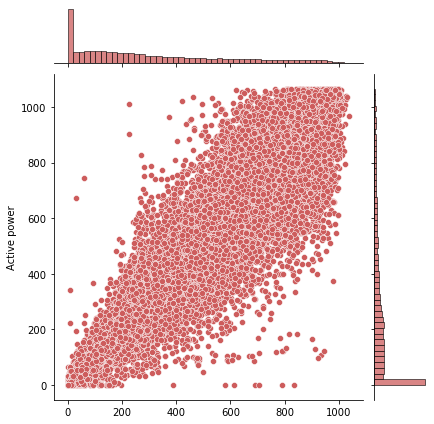

In [74]:
sns.jointplot(x=y_pred4,y=y_test,kind='scatter',color='indianred')

# Starting with the solar dataset

In [75]:
dfs=pd.read_csv('Solar_dataset.csv')

In [76]:
dfs.head()

,Location,Date,Time,Latitude,Longitude,Altitude,YRMODAHRMI,Month,Hour,Season,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling
0,Camp Murray,20171203,1145,47.11,-122.57,84,2.017120e+11,12,11,Winter,81.71997,12.86919,2.42769,5,10.0,1010.6,722
1,Camp Murray,20171203,1315,47.11,-122.57,84,2.017120e+11,12,13,Winter,96.64917,9.66415,2.46273,0,10.0,1011.3,23
2,Camp Murray,20171203,1330,47.11,-122.57,84,2.017120e+11,12,13,Winter,93.61572,15.44983,4.46836,5,10.0,1011.6,32
3,Camp Murray,20171204,1230,47.11,-122.57,84,2.017120e+11,12,12,Winter,77.21558,10.36659,1.65364,5,2.0,1024.4,6
4,Camp Murray,20171204,1415,47.11,-122.57,84,2.017120e+11,12,14,Winter,54.80347,16.85471,6.57939,3,3.0,1023.7,9


In [77]:
corrs=dfs.corr()
corrs.style.background_gradient(cmap='coolwarm')

,Date,Time,Latitude,Longitude,Altitude,YRMODAHRMI,Month,Hour,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling
Date,1.000000,0.012083,0.199342,-0.044425,-0.066245,0.999998,-0.590628,0.009139,0.113511,-0.086950,0.019585,0.033170,-0.027652,0.064530,-0.041170
Time,0.012083,1.000000,0.059200,0.012944,0.042469,0.012107,-0.014654,0.997480,-0.193018,0.158975,0.080991,0.140824,0.012840,-0.049732,-0.025734
Latitude,0.199342,0.059200,1.000000,0.139986,0.297815,0.199295,0.029025,0.052146,-0.122635,-0.227330,-0.253049,-0.147172,-0.068808,-0.306348,-0.076072
Longitude,-0.044425,0.012944,0.139986,1.000000,0.105826,-0.044448,0.074910,0.004862,0.019834,0.068384,0.012446,-0.063132,-0.019893,-0.090606,-0.185584
Altitude,-0.066245,0.042469,0.297815,0.105826,1.000000,-0.066246,0.020087,0.037071,-0.428903,0.099108,-0.077585,-0.009769,0.024248,-0.997164,0.003516
YRMODAHRMI,0.999998,0.012107,0.199295,-0.044448,-0.066246,1.000000,-0.590559,0.009163,0.113514,-0.086948,0.019592,0.033183,-0.027730,0.064537,-0.041172
Month,-0.590628,-0.014654,0.029025,0.074910,0.020087,-0.590559,1.000000,-0.010423,-0.127632,0.213217,-0.024981,-0.084922,0.063204,-0.019603,0.091687
Hour,0.009139,0.997480,0.052146,0.004862,0.037071,0.009163,-0.010423,1.000000,-0.209345,0.169163,0.094935,0.137463,0.026201,-0.044172,-0.004694
Humidity,0.113511,-0.193018,-0.122635,0.019834,-0.428903,0.113514,-0.127632,-0.209345,1.000000,-0.571742,-0.397819,0.059444,-0.274019,0.430945,-0.475787
AmbientTemp,-0.086950,0.158975,-0.227330,0.068384,0.099108,-0.086948,0.213217,0.169163,-0.571742,1.000000,0.580395,-0.098761,0.233031,-0.097168,0.331845


In [78]:
# Lets Drop the unnecessary columns YRMODHARMI is dropped Date , time and hour is dropped while Month is retained 
# Longitude, Altitude is dropped because of very low correlation
# Location is also dropped  because not needed in our analysis
# Season is also dropped as it can be easily predicted with the month 
list_drop=['Date','Time','YRMODAHRMI','Longitude','Altitude','Hour','Altitude','Location','Season']
dfs1=dfs.copy()
dfs1=dfs1.drop(list_drop,axis=1)
dfs1.dropna(inplace=True)
dfs1.head()


,Latitude,Month,Humidity,AmbientTemp,PolyPwr,Wind.Speed,Visibility,Pressure,Cloud.Ceiling
0,47.11,12,81.71997,12.86919,2.42769,5,10.0,1010.6,722
1,47.11,12,96.64917,9.66415,2.46273,0,10.0,1011.3,23
2,47.11,12,93.61572,15.44983,4.46836,5,10.0,1011.6,32
3,47.11,12,77.21558,10.36659,1.65364,5,2.0,1024.4,6
4,47.11,12,54.80347,16.85471,6.57939,3,3.0,1023.7,9


<AxesSubplot:>

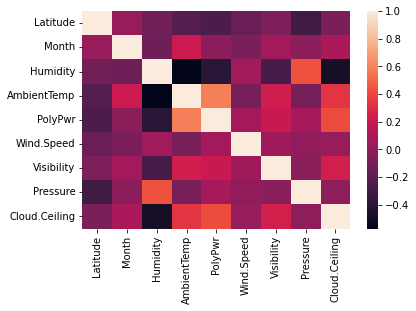

In [79]:
corrs1=dfs1.corr()
sns.heatmap(corrs1,xticklabels=corrs1.columns.values,
            yticklabels=corrs1.columns.values)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


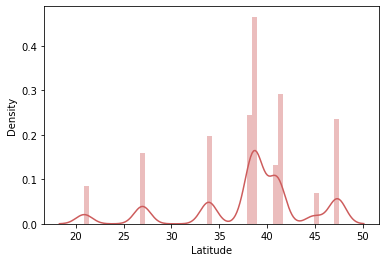

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


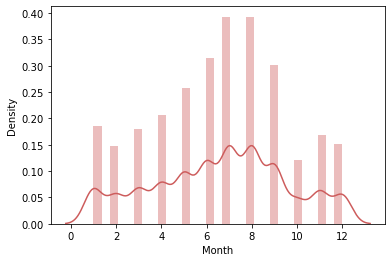

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


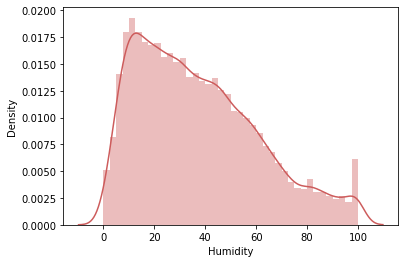

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


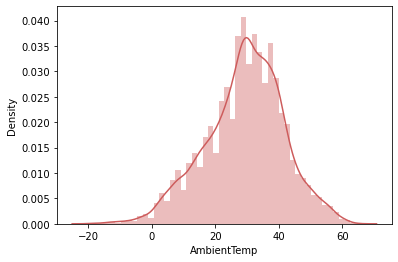

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


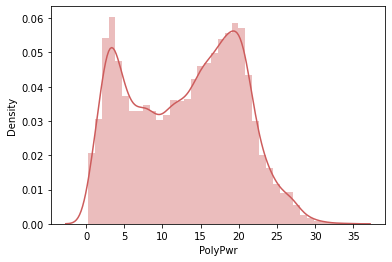

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


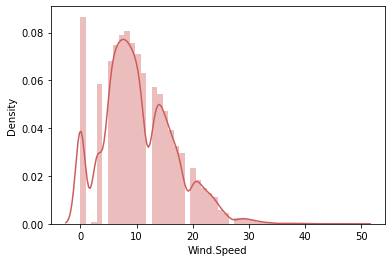

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


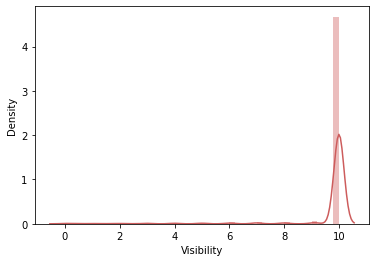

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


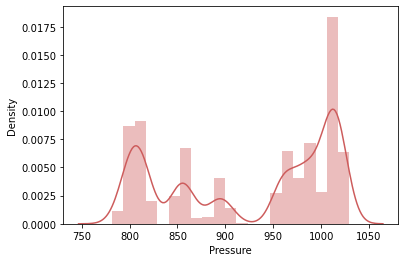

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


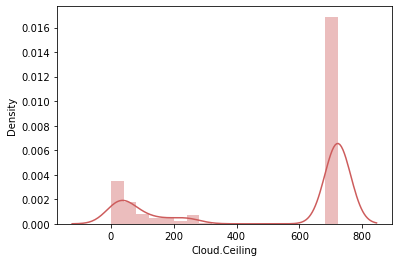

In [80]:
# Lets Check for the distribution of the data
list_dfs_columns=list(dfs1.columns)
for t in list_dfs_columns:
    sns.distplot(dfs1[t],color='indianred')
    plt.show()

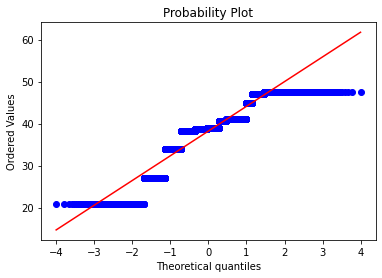

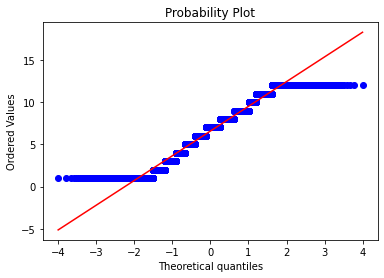

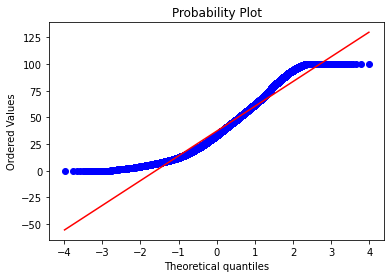

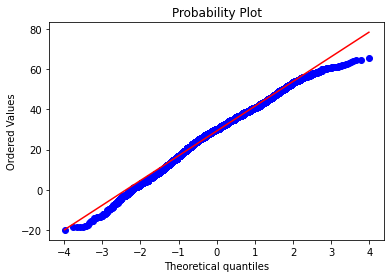

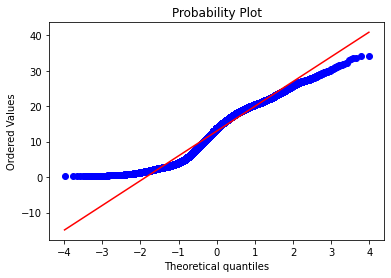

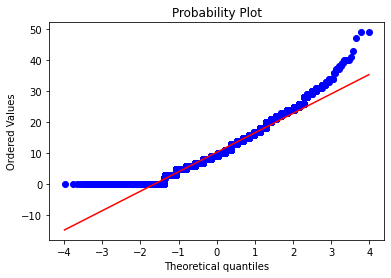

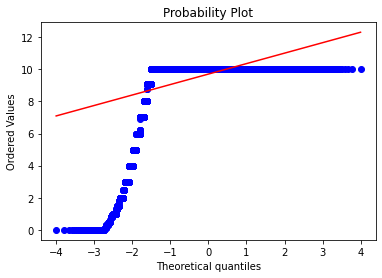

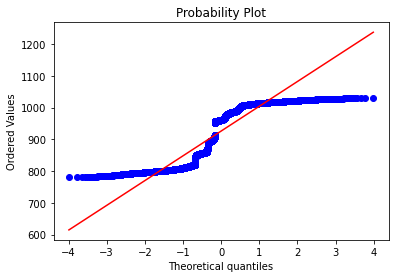

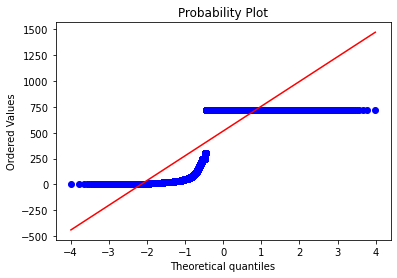

In [81]:
for t in list_dfs_columns:
    stats.probplot(dfs1[t], dist="norm", plot=py)
    py.show()

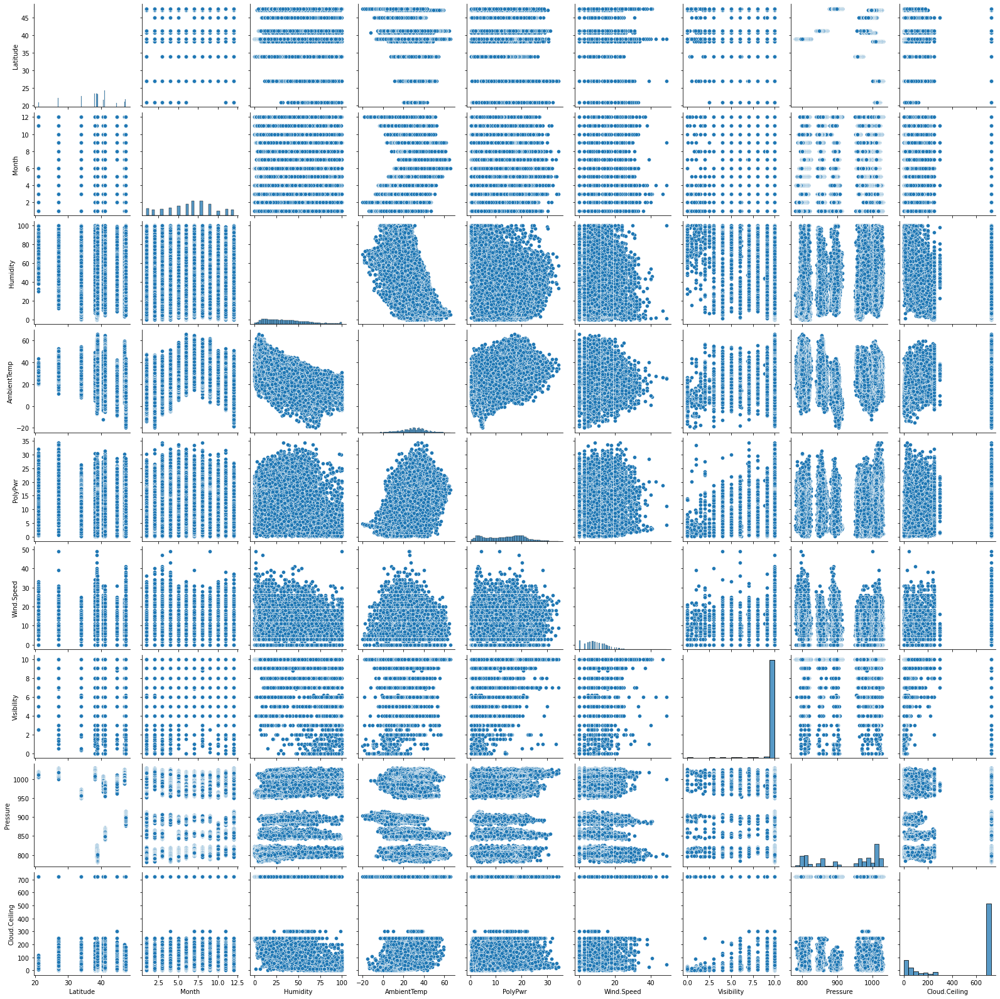

In [82]:
#Pairplot for all correlations
sns.pairplot(dfs1)

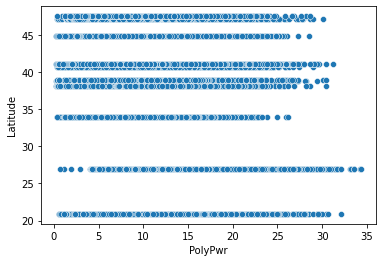

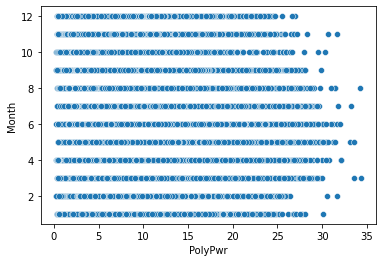

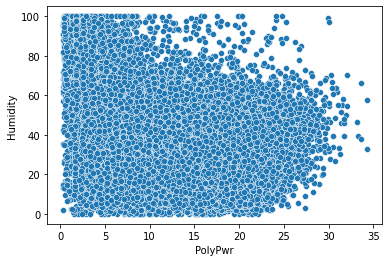

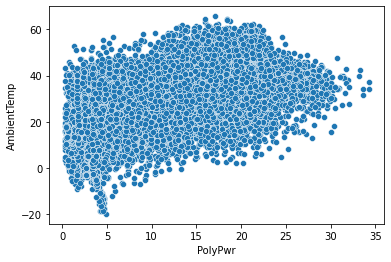

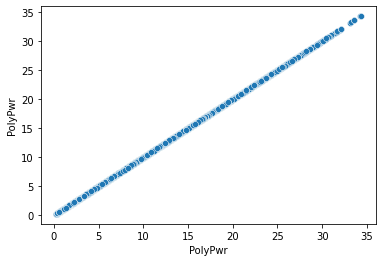

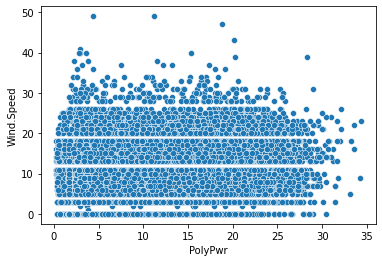

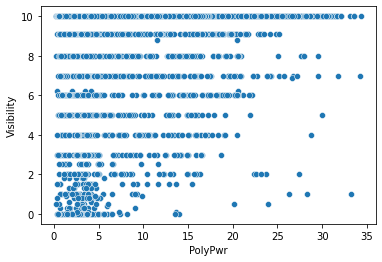

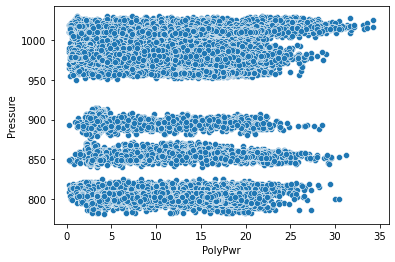

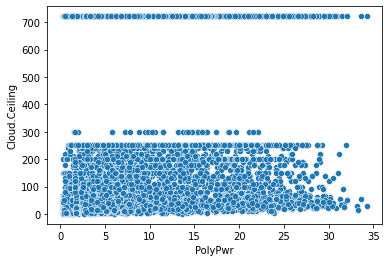

In [83]:
#Lets look for correlation between our target that is power and other features
for y in list_dfs_columns:
    sns.scatterplot(x=dfs['PolyPwr'],y=dfs[y])
    plt.show()

In [84]:
X2=dfs1.loc[:,['Humidity','AmbientTemp','Visibility','Latitude','Month','Wind.Speed','Pressure','Cloud.Ceiling']]
Y2=dfs1.loc[:,'PolyPwr']
X2.head()

,Humidity,AmbientTemp,Visibility,Latitude,Month,Wind.Speed,Pressure,Cloud.Ceiling
0,81.71997,12.86919,10.0,47.11,12,5,1010.6,722
1,96.64917,9.66415,10.0,47.11,12,0,1011.3,23
2,93.61572,15.44983,10.0,47.11,12,5,1011.6,32
3,77.21558,10.36659,2.0,47.11,12,5,1024.4,6
4,54.80347,16.85471,3.0,47.11,12,3,1023.7,9


In [85]:
sx_train, sx_test, sy_train, sy_test = train_test_split(X2, Y2, test_size=0.2, random_state=0)

In [86]:
# RandomForestModel
reg3=RandomForestRegressor(n_estimators=100,random_state=0)

In [87]:
reg3.fit(sx_train,sy_train)

RandomForestRegressor(random_state=0)

In [88]:
y_pred_solar_rf=reg3.predict(sx_test)

In [89]:
r2_score(y_pred_solar_rf,sy_test)

0.4407568048978012

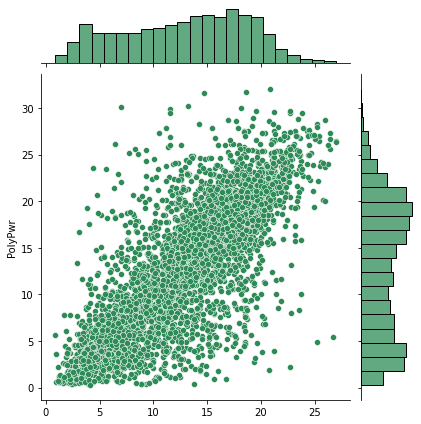

In [90]:
sns.jointplot(x=y_pred_solar_rf,y=sy_test,kind='scatter',color='seagreen')

In [91]:
#Linear model
reg4=LinearRegression()
reg4.fit(sx_train,sy_train)
y_pred_solar_lin=reg4.predict(sx_test)
r2_score(y_pred_solar_lin,sy_test)

-0.21696084951440553

In [92]:
from sklearn.svm import SVR

In [93]:
# Support vector machine model
reg_svr=SVR(kernel='rbf')

In [94]:
reg_svr.fit(sx_train,sy_train)
y_pred_solar_svr=reg_svr.predict(sx_test)
r2_score(y_pred_solar_svr,sy_test)

-0.6924566822437626

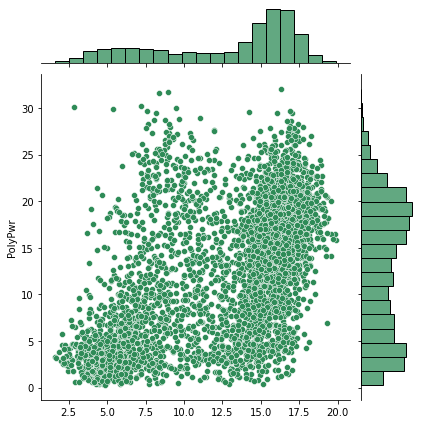

In [95]:
sns.jointplot(x=y_pred_solar_svr,y=sy_test,kind='scatter',color='seagreen')

In [96]:
# Hence we can see that randomforestregressor gives the best accuracy

In [97]:
# So we are getting our r2 score around 0.4 which is fair enough
df1.head()

,Wind_speed,Wind_direction,Temp_of_environment,Temperature_of_turbine,Nacelle direction,Pitch angle of blade 1,Pitch angle of blade 2,Pitch angle of blade 3,Reactive power,Active power
index,,,,,,,,,,
0,1.927164,-4.58,29.87,40.70,20.91,1.00,1.00,1.00,-0.25,577.47
1,1.882514,-3.02,29.89,40.76,5.73,1.00,1.00,1.00,-0.27,619.05
2,1.932970,5.91,34.38,46.42,32.56,1.11,1.11,1.11,-0.02,628.13
3,1.843719,-2.81,35.87,46.49,47.97,1.12,1.12,1.12,0.01,457.33
4,1.763017,-42.78,39.33,50.18,81.45,1.90,1.90,1.90,-0.30,-0.30


#Hence most of our raw coding has been done lets make a user friendly function for directly  getting our target which is sum of Power

In [98]:
def expected_power(turbine_dataset,solar_dataset):
    turbine_dataset=turbine_dataset.dropna()
    solar_dataset=solar_dataset.dropna()
    turbine_dataset_test=turbine_dataset.loc[:,['Wind_speed','Wind_direction',' Pitch angle of blade 1','Pitch angle of blade 2','Pitch angle of blade 3']]
    y_pred_turbine=reg2.predict(turbine_dataset_test)
    solar_dataset_test=solar_dataset.loc[:,['Humidity','AmbientTemp','Visibility','Latitude','Month','Wind.Speed','Pressure','Cloud.Ceiling']]
    y_pred_solar=reg3.predict(solar_dataset_test)
    y_pred_turbine=pd.DataFrame(y_pred_turbine,columns=['Power Generated Through Turbine'])
    y_pred_solar=pd.DataFrame(y_pred_solar,columns=['Power Generated Through Solar'])
    list_pred=[y_pred_turbine,y_pred_solar]
    Power=pd.concat(list_pred,axis=1)
    Power.dropna(inplace=True)
    Power['Total Power']=Power['Power Generated Through Turbine'] + Power['Power Generated Through Solar']
    return Power
    
    
                                            
    
    


# So now our predicitive function is ready lets see it in action

In [99]:
test_turbine=df.loc[::100,:]
test_solar=dfs.loc[::10,:]

In [100]:
expected_power(test_turbine,test_solar)

,Power Generated Through Turbine,Power Generated Through Solar,Total Power
0,945.5085,2.886267,948.394767
1,916.1970,3.664594,919.861594
2,938.5910,1.895675,940.486675
3,963.9551,4.011272,967.966372
4,969.4599,3.631553,973.091453
...,...,...,...
2100,770.9618,14.204194,785.165993
2101,902.5529,10.763470,913.316370
2102,912.8187,13.485452,926.304152
2103,985.6967,12.559046,998.255746


# Thank you for being with me till the end 

# Regards Mihir Sinha